In [1]:
import scanpy as sc
import pandas as pd
import pickle
import scnsbm 
import time
import anndata
import sklearn.metrics
%matplotlib notebook
%pylab

/home/morelli/anaconda3/envs/scrna/lib/python3.7/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/morelli/anaconda3/envs/scrna/lib/python3.7/site-packages/graph_tool/draw/cairo_draw.py:39: RuntimeWarning: Error importing cairo. Graph drawing will not work.
  warnings.warn(msg, RuntimeWarning)
/home/morelli/anaconda3/envs/scrna/lib/python3.7/site-packages/graph_tool/draw/cairo_draw.py:39: RuntimeWarning: Error importing cairo. Graph drawing will not work.
  warnings.warn(msg, RuntimeWarning)
/home/morelli/anaconda3/envs/scrna/lib/python3.7/site-packages/graph_tool/draw/cairo_draw.py:39: RuntimeWarning: Error importing cairo. Graph drawing will not work.
  warnings.warn(msg, RuntimeWarning)
/home/morelli/anaconda3/envs/scrna/lib/python3.7/site-packages/graph_tool/all.py:40: RuntimeWarning: Error im

Using matplotlib backend: nbAgg
Populating the interactive namespace from numpy and matplotlib


In [2]:
df= pd.read_table("matrix_mixology/sc_10x_5cl.count.csv.gz", compression="gzip", sep=",")
df

,Lib90_00000,Lib90_00001,Lib90_00002,Lib90_00003,Lib90_00004,Lib90_00005,Lib90_00006,Lib90_00007,Lib90_00008,Lib90_00009,...,Lib90_04012,Lib90_04014,Lib90_04017,Lib90_04019,Lib90_04024,Lib90_04026,Lib90_04028,Lib90_04029,Lib90_04048,Lib90_04057
COL27A1,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
SLC35B1,3,5,5,5,5,4,6,6,11,2,...,0,1,0,0,0,1,2,0,0,0
POLR3D,2,2,1,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SMC4,30,52,60,24,33,12,11,7,32,8,...,0,0,0,0,5,2,1,1,0,1
MAST2,4,2,0,1,0,5,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DZIP1,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
NIPA1,0,0,0,0,2,2,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
KRT7,296,286,38,155,442,150,444,197,315,71,...,14,0,2,27,4,22,13,3,16,2
RAC2,3,4,0,9,5,8,15,10,3,2,...,0,0,0,0,0,0,0,0,0,0


In [2]:
df= pd.read_table("matrix_mixology/sc_10x_5cl.count.csv.gz", compression="gzip", sep=",")
adata = anndata.AnnData(df.T)#.values.T, obs=df.columns, var=df.index)
cell_cycle_genes = [x.strip() for x in open('regressed_genes/regev_lab_cell_cycle_genes.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
mito_genes = adata.var_names.str.startswith('MT-') 
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1) 
adata.obs['n_counts'] = adata.X.sum(axis=1)
np.sum(adata[:, mito_genes].X, axis=1)
adata = adata[adata.obs['percent_mito'] < 0.05, :]
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
adata.raw = adata
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
sc.pp.highly_variable_genes(adata, min_mean=0.05, max_mean=3, min_disp=0.5)
adata = adata[:, adata.var['highly_variable']]
sc.pp.regress_out(adata, ['S_score', 'G2M_score','n_counts', 'percent_mito'])
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack')
adata.write('mi_10x/adata_base.h5ad')

Trying to set attribute `.obs` of view, making a copy.


Trying to set attribute `.obs` of view, making a copy.
... storing 'phase' as categorical


In [7]:
adata=sc.read('mi_10x/adata_base.h5ad')

In [8]:
nei=[5,10,20,30,40,50,100]
adatone=[]
for x in nei:
    adata=sc.read('mi_10x/adata_base.h5ad')
    sc.pp.neighbors(adata, n_neighbors=x, n_pcs=40)
    adatone.append(adata)
adatone[0].write('mi_10x/adata_5.h5ad')
adatone[1].write('mi_10x/adata_10.h5ad')
adatone[2].write('mi_10x/adata_20.h5ad')
adatone[3].write('mi_10x/adata_30.h5ad')
adatone[4].write('mi_10x/adata_40.h5ad')
adatone[5].write('mi_10x/adata_50.h5ad')
adatone[6].write('mi_10x/adata_100.h5ad')

In [9]:
adata5=sc.read('mi_10x/adata_5.h5ad')
adata10=sc.read('mi_10x/adata_10.h5ad')
adata20=sc.read('mi_10x/adata_20.h5ad')
adata30=sc.read('mi_10x/adata_30.h5ad')
adata40=sc.read('mi_10x/adata_40.h5ad')
adata50=sc.read('mi_10x/adata_50.h5ad')
adata100=sc.read('mi_10x/adata_100.h5ad')

In [10]:
cell_annotation= pd.read_table('matrix_mixology/sc_10x_5cl.metadata.csv.gz', compression="gzip", sep=",", index_col=0)
adata5.obs.loc[:, "cell_line"] = cell_annotation.loc[adata5.obs_names, "cell_line"]
adata10.obs.loc[:, "cell_line"] = cell_annotation.loc[adata10.obs_names, "cell_line"]
adata20.obs.loc[:, "cell_line"] = cell_annotation.loc[adata20.obs_names, "cell_line"]
adata30.obs.loc[:, "cell_line"] = cell_annotation.loc[adata30.obs_names, "cell_line"]
adata40.obs.loc[:, "cell_line"] = cell_annotation.loc[adata40.obs_names, "cell_line"]
adata50.obs.loc[:, "cell_line"] = cell_annotation.loc[adata50.obs_names, "cell_line"]
adata100.obs.loc[:, "cell_line"] = cell_annotation.loc[adata100.obs_names, "cell_line"]
adata5.write('mi_10x/adata_5.h5ad')
adata10.write('mi_10x/adata_10.h5ad')
adata20.write('mi_10x/adata_20.h5ad')
adata30.write('mi_10x/adata_30.h5ad')
adata40.write('mi_10x/adata_40.h5ad')
adata50.write('mi_10x/adata_50.h5ad')
adata100.write('mi_10x/adata_100.h5ad')

... storing 'cell_line' as categorical
... storing 'cell_line' as categorical
... storing 'cell_line' as categorical
... storing 'cell_line' as categorical
... storing 'cell_line' as categorical
... storing 'cell_line' as categorical
... storing 'cell_line' as categorical


In [22]:
adata5=sc.read('mi_10x/adata_5.h5ad')
adata10=sc.read('mi_10x/adata_10.h5ad')
adata20=sc.read('mi_10x/adata_20.h5ad')
adata30=sc.read('mi_10x/adata_30.h5ad')
adata40=sc.read('mi_10x/adata_40.h5ad')
adata50=sc.read('mi_10x/adata_50.h5ad')
adata100=sc.read('mi_10x/adata_100.h5ad')

# 1) leiden in range
### 1.1) leiden unweighted

In [23]:
resolutions = np.arange(0, 1, 0.005)

In [24]:
leiden_clusters = pd.DataFrame(index=adata5.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata5, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata5.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_5_unweighted.pkl",'wb'),2)

In [25]:
leiden_clusters = pd.DataFrame(index=adata10.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata10, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata10.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_10_unweighted.pkl",'wb'),2)

In [26]:
leiden_clusters = pd.DataFrame(index=adata20.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata20, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata20.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_20_unweighted.pkl",'wb'),2)

In [27]:
leiden_clusters = pd.DataFrame(index=adata50.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata50, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata50.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_50_unweighted.pkl",'wb'),2)

In [28]:
leiden_clusters = pd.DataFrame(index=adata30.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata30, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata30.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_30_unweighted.pkl",'wb'),2)

In [29]:
leiden_clusters = pd.DataFrame(index=adata40.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata40, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata40.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_40_unweighted.pkl",'wb'),2)

In [30]:
leiden_clusters = pd.DataFrame(index=adata100.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata100, resolution=r, use_weights=False)
    leiden_clusters.loc[:, r] = adata100.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_100_unweighted.pkl",'wb'),2)

In [32]:
unw_leiden_clusters5=pickle.load( open( "mi_10x/10x_leiden_clusters_5_unweighted.pkl", "rb" ))
unw_leiden_clusters10=pickle.load( open( "mi_10x/10x_leiden_clusters_10_unweighted.pkl", "rb" ))
unw_leiden_clusters20=pickle.load( open( "mi_10x/10x_leiden_clusters_20_unweighted.pkl", "rb" ))
unw_leiden_clusters30=pickle.load( open( "mi_10x/10x_leiden_clusters_30_unweighted.pkl", "rb" ))
unw_leiden_clusters40=pickle.load( open( "mi_10x/10x_leiden_clusters_40_unweighted.pkl", "rb" ))
unw_leiden_clusters50=pickle.load( open( "mi_10x/10x_leiden_clusters_50_unweighted.pkl", "rb" ))
unw_leiden_clusters100=pickle.load( open( "mi_10x/10x_leiden_clusters_100_unweighted.pkl", "rb" ))

### 1.2) leiden weighted

In [33]:
adata5=sc.read('mi_10x/adata_5.h5ad')
adata10=sc.read('mi_10x/adata_10.h5ad')
adata20=sc.read('mi_10x/adata_20.h5ad')
adata30=sc.read('mi_10x/adata_30.h5ad')
adata40=sc.read('mi_10x/adata_40.h5ad')
adata50=sc.read('mi_10x/adata_50.h5ad')
adata100=sc.read('mi_10x/adata_100.h5ad')

In [34]:
leiden_clusters = pd.DataFrame(index=adata5.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata5, resolution=r)
    leiden_clusters.loc[:, r] = adata5.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_5_weighted.pkl",'wb'),2)

In [35]:
leiden_clusters = pd.DataFrame(index=adata10.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata10, resolution=r)
    leiden_clusters.loc[:, r] = adata10.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_10_weighted.pkl",'wb'),2)

In [36]:
leiden_clusters = pd.DataFrame(index=adata20.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata20, resolution=r)
    leiden_clusters.loc[:, r] = adata20.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_20_weighted.pkl",'wb'),2)

In [37]:
leiden_clusters = pd.DataFrame(index=adata30.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata30, resolution=r)
    leiden_clusters.loc[:, r] = adata30.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_30_weighted.pkl",'wb'),2)

In [38]:
leiden_clusters = pd.DataFrame(index=adata40.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata40, resolution=r)
    leiden_clusters.loc[:, r] = adata40.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_40_weighted.pkl",'wb'),2)

In [39]:
leiden_clusters = pd.DataFrame(index=adata50.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata50, resolution=r)
    leiden_clusters.loc[:, r] = adata50.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_50_weighted.pkl",'wb'),2)

In [40]:
leiden_clusters = pd.DataFrame(index=adata100.obs_names, columns=resolutions)
for r in resolutions:
    sc.tl.leiden(adata100, resolution=r)
    leiden_clusters.loc[:, r] = adata100.obs.leiden
pickle.dump(leiden_clusters,open("mi_10x/10x_leiden_clusters_100_weighted.pkl",'wb'),2)

In [41]:
w_leiden_clusters5=pickle.load( open( "mi_10x/10x_leiden_clusters_5_weighted.pkl", "rb" ))
w_leiden_clusters10=pickle.load( open( "mi_10x/10x_leiden_clusters_10_weighted.pkl", "rb" ))
w_leiden_clusters20=pickle.load( open( "mi_10x/10x_leiden_clusters_20_weighted.pkl", "rb" ))
w_leiden_clusters30=pickle.load( open( "mi_10x/10x_leiden_clusters_30_weighted.pkl", "rb" ))
w_leiden_clusters40=pickle.load( open( "mi_10x/10x_leiden_clusters_40_weighted.pkl", "rb" ))
w_leiden_clusters50=pickle.load( open( "mi_10x/10x_leiden_clusters_50_weighted.pkl", "rb" ))
w_leiden_clusters100=pickle.load( open( "mi_10x/10x_leiden_clusters_100_weighted.pkl", "rb" ))

# 2) nsbm
### 2.1) nsbm unweighted

In [26]:
adata5=sc.read('mi_10x/adata_5.h5ad')
adata10=sc.read('mi_10x/adata_10.h5ad')
adata20=sc.read('mi_10x/adata_20.h5ad')
adata30=sc.read('mi_10x/adata_30.h5ad')
adata40=sc.read('mi_10x/adata_40.h5ad')
adata50=sc.read('mi_10x/adata_50.h5ad')
adata100=sc.read('mi_10x/adata_100.h5ad')

In [41]:
a=time.time()
scnsbm.inference.nested_model(adata5)
b=time.time()
scnsbm.inference.nested_model(adata10)
c=time.time()
scnsbm.inference.nested_model(adata20)
d=time.time()
scnsbm.inference.nested_model(adata30)
e=time.time()
scnsbm.inference.nested_model(adata40)
f=time.time()
scnsbm.inference.nested_model(adata50)
g=time.time()
scnsbm.inference.nested_model(adata100)
h=time.time()
aa=b-a
bb=c-b
cc=d-c
dd=e-d
ee=f-e
ff=g-f
gg=h-g
print(aa,bb,cc,dd,ee,ff,gg)
adata5.write('mi_10x/adata_5_unweighted.h5ad')
adata10.write('mi_10x/adata_10_unweighted.h5ad')
adata20.write('mi_10x/adata_20_unweighted.h5ad')
adata30.write('mi_10x/adata_30_unweighted.h5ad')
adata40.write('mi_10x/adata_40_unweighted.h5ad')
adata50.write('mi_10x/adata_50_unweighted.h5ad')
adata100.write('mi_10x/adata_100_unweighted.h5ad')

977.8120496273041 1258.349713563919 1542.4280335903168 1791.153357744217 2235.1822185516357 2266.4309055805206 3702.407413959503


In [14]:
unw_adata5=sc.read('mi_10x/adata_5_unweighted.h5ad')
unw_adata10=sc.read('mi_10x/adata_10_unweighted.h5ad')
unw_adata20=sc.read('mi_10x/adata_20_unweighted.h5ad')
unw_adata30=sc.read('mi_10x/adata_30_unweighted.h5ad')
unw_adata40=sc.read('mi_10x/adata_40_unweighted.h5ad')
unw_adata50=sc.read('mi_10x/adata_50_unweighted.h5ad')
unw_adata100=sc.read('mi_10x/adata_100_unweighted.h5ad')

### 2.2) nsbm weighted

In [3]:
adata5=sc.read('mi_10x/adata_5.h5ad')
adata10=sc.read('mi_10x/adata_10.h5ad')
adata20=sc.read('mi_10x/adata_20.h5ad')
adata30=sc.read('mi_10x/adata_30.h5ad')
adata40=sc.read('mi_10x/adata_40.h5ad')
adata50=sc.read('mi_10x/adata_50.h5ad')
adata100=sc.read('mi_10x/adata_100.h5ad')

In [4]:
a=time.time()
scnsbm.inference.nested_model(adata5,use_weights=True)
b=time.time()
scnsbm.inference.nested_model(adata10,use_weights=True)
c=time.time()
scnsbm.inference.nested_model(adata20,use_weights=True)
d=time.time()
scnsbm.inference.nested_model(adata30,use_weights=True)
e=time.time()
scnsbm.inference.nested_model(adata40,use_weights=True)
f=time.time()
scnsbm.inference.nested_model(adata50,use_weights=True)
g=time.time()
scnsbm.inference.nested_model(adata100,use_weights=True)
h=time.time()
aa=b-a
bb=c-b
cc=d-c
dd=e-d
ee=f-e
ff=g-f
gg=h-g
print(aa,bb,cc,dd,ee,ff,gg)
adata5.write('mi_10x/adata_5_weighted.h5ad')
adata10.write('mi_10x/adata_10_weighted.h5ad')
adata20.write('mi_10x/adata_20_weighted.h5ad')
adata30.write('mi_10x/adata_30_weighted.h5ad')
adata40.write('mi_10x/adata_40_weighted.h5ad')
adata50.write('mi_10x/adata_50_weighted.h5ad')
adata100.write('mi_10x/adata_100_weighted.h5ad')

/usr/lib/python3/dist-packages/graph_tool/draw/cairo_draw.py:39: RuntimeWarning: Error importing cairo. Graph drawing will not work.
  warnings.warn(msg, RuntimeWarning)
/usr/lib/python3/dist-packages/graph_tool/draw/cairo_draw.py:39: RuntimeWarning: Error importing cairo. Graph drawing will not work.
  warnings.warn(msg, RuntimeWarning)
/usr/lib/python3/dist-packages/graph_tool/draw/cairo_draw.py:39: RuntimeWarning: Error importing cairo. Graph drawing will not work.
  warnings.warn(msg, RuntimeWarning)
/usr/lib/python3/dist-packages/graph_tool/all.py:40: RuntimeWarning: Error importing draw module, proceeding nevertheless: /usr/lib/python3/dist-packages/cairo/_cairo.cpython-37m-x86_64-linux-gnu.so: undefined symbol: cairo_tee_surface_index
  warnings.warn(msg, RuntimeWarning)


3556.8158531188965 2274.9869272708893 2495.2503514289856 1705.0587067604065 3711.194542169571


In [12]:
w_adata5=sc.read('mi_10x/adata_5_weighted.h5ad')
w_adata10=sc.read('mi_10x/adata_10_weighted.h5ad')
w_adata20=sc.read('mi_10x/adata_20_weighted.h5ad')
w_adata30=sc.read('mi_10x/adata_30_weighted.h5ad')
w_adata40=sc.read('mi_10x/adata_40_weighted.h5ad')
w_adata50=sc.read('mi_10x/adata_50_weighted.h5ad')
w_adata100=sc.read('mi_10x/adata_100_weighted.h5ad')

# Representation
### unweighted nsbm

/home/morelli/anaconda3/envs/scrna/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


<IPython.core.display.Javascript object>


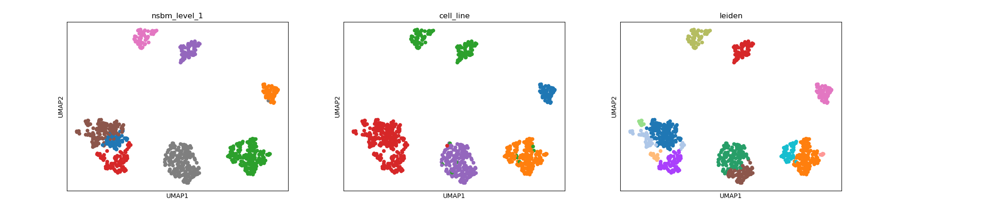

<IPython.core.display.Javascript object>


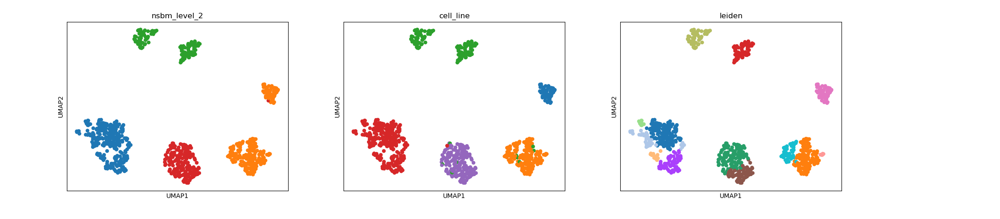

<IPython.core.display.Javascript object>


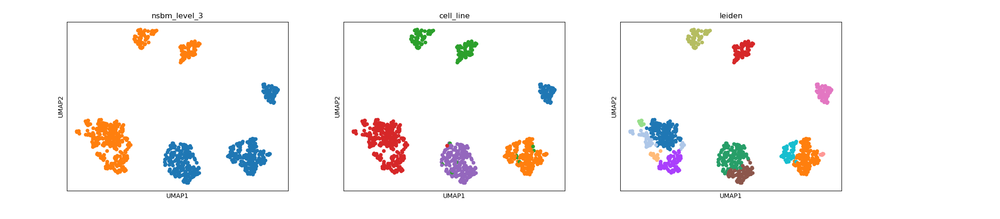

<IPython.core.display.Javascript object>


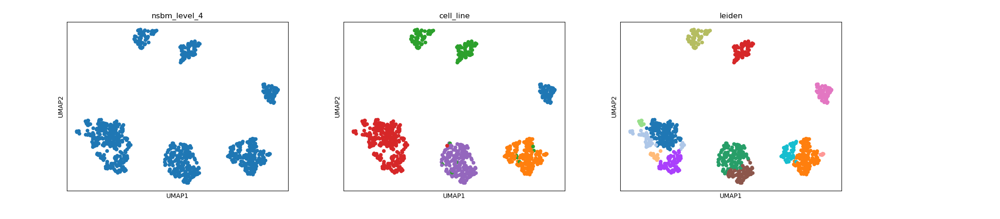

In [43]:
sc.tl.leiden(unw_adata5)
sc.tl.umap(unw_adata5)
sc.pl.umap(unw_adata5, color=["nsbm_level_1", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata5, color=["nsbm_level_2", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata5, color=["nsbm_level_3",'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata5, color=["nsbm_level_4", 'cell_line','leiden'], legend_loc='on_data')


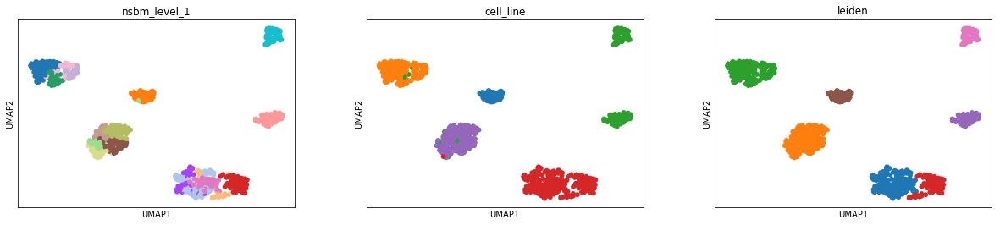

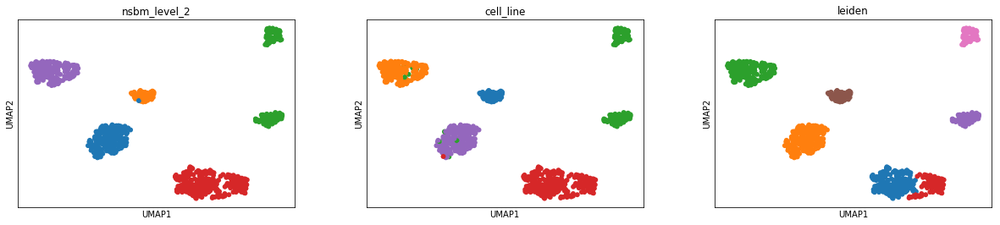

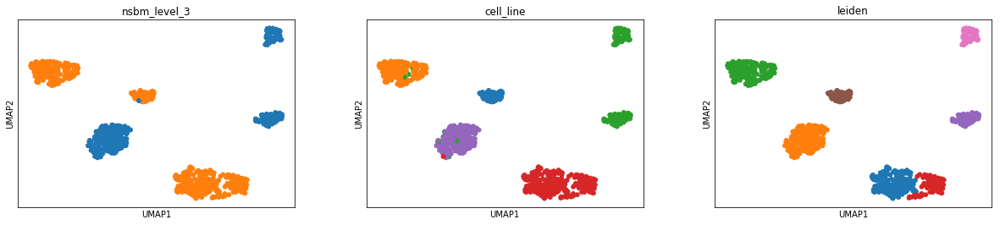

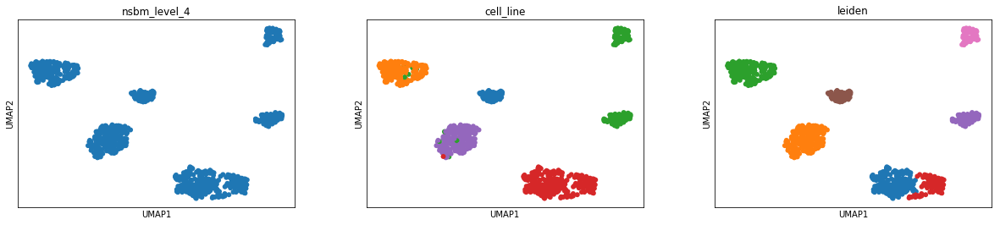

In [16]:
sc.tl.leiden(unw_adata10, resolution=.5)

sc.tl.umap(unw_adata10)
sc.pl.umap(unw_adata10, color=["nsbm_level_1", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata10, color=["nsbm_level_2", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata10, color=["nsbm_level_3",  'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata10, color=["nsbm_level_4",  'cell_line','leiden'], legend_loc='on_data')

In [21]:
cm = pd.DataFrame(unw_adata10.uns["nsbm"]["cell_marginals"][2], index=unw_adata10.obs_names)

KeyError: 'cell_marginals'

In [37]:
pd.Categorical(cm.loc[:, 4].values> 3000)

[True, True, True, True, True, ..., True, True, True, True, True]
Length: 860
Categories (2, object): [False, True]

In [69]:
unw_adata10.obs.loc[: ,"sticazzi"] = pd.Categorical(cm.loc[:, 0].values > 5000)

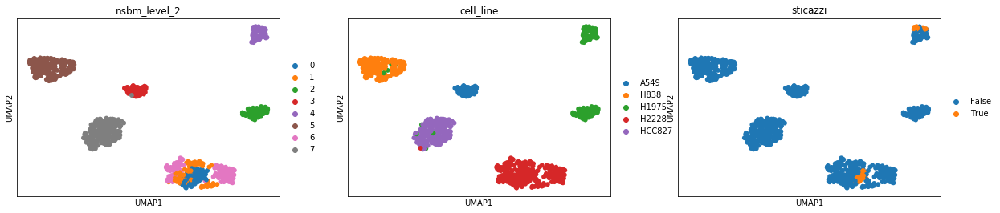

In [70]:
sc.pl.umap(unw_adata10, color=["nsbm_level_2", "cell_line", "sticazzi"])

In [68]:
np.unique(unw_adata10.obs[(unw_adata10.obs.sticazzi == True) ].cell_line)

array(['H1975', 'H2228'], dtype=object)

<IPython.core.display.Javascript object>


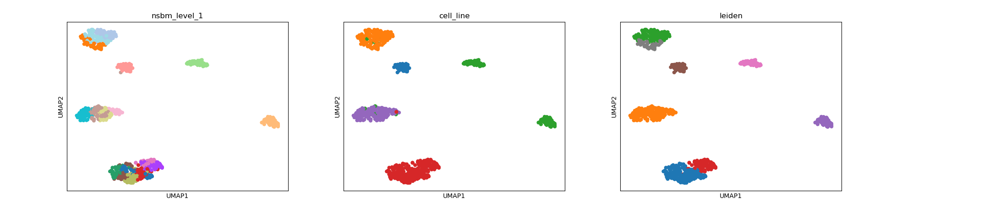

<IPython.core.display.Javascript object>


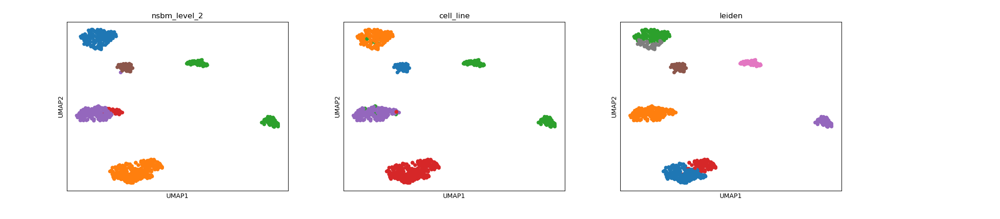

<IPython.core.display.Javascript object>


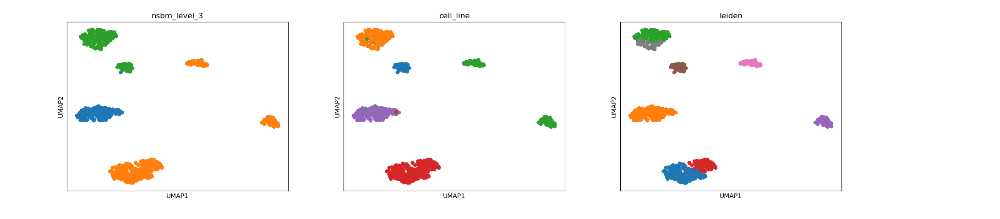

<IPython.core.display.Javascript object>


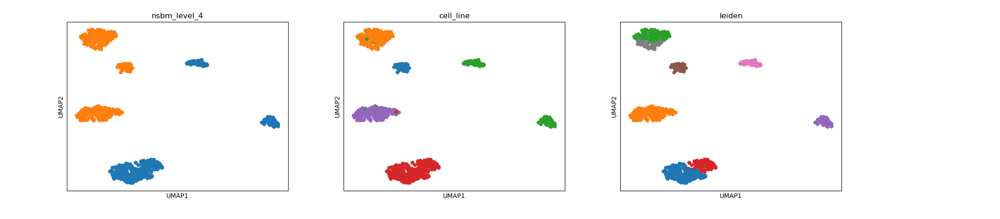

<IPython.core.display.Javascript object>


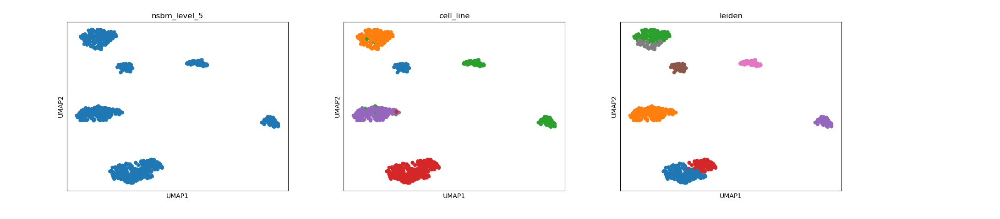

<IPython.core.display.Javascript object>


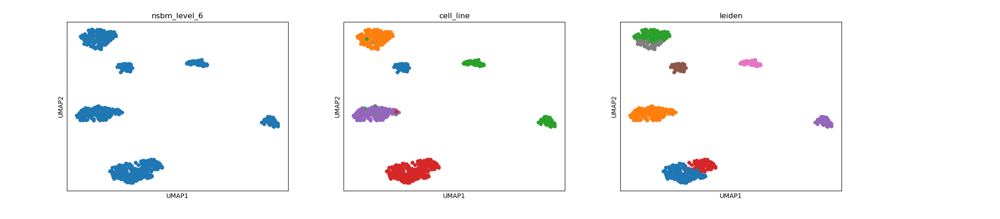

In [44]:
sc.tl.leiden(unw_adata20)
sc.tl.umap(unw_adata20)
sc.pl.umap(unw_adata20, color=["nsbm_level_1",  'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata20, color=["nsbm_level_2", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata20, color=["nsbm_level_3", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata20, color=["nsbm_level_4", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata20, color=["nsbm_level_5", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata20, color=["nsbm_level_6", 'cell_line', 'leiden'], legend_loc='on_data')

<IPython.core.display.Javascript object>


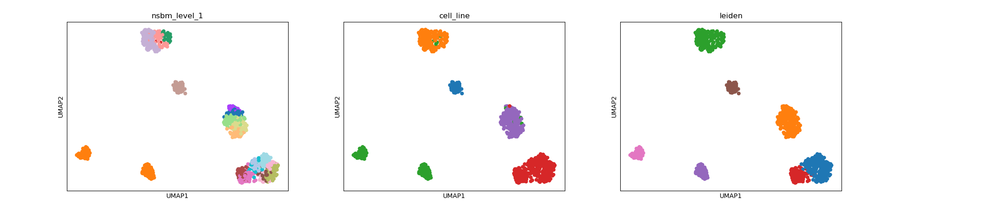

<IPython.core.display.Javascript object>


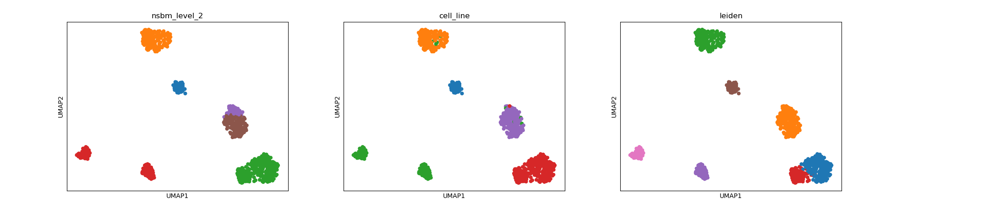

<IPython.core.display.Javascript object>


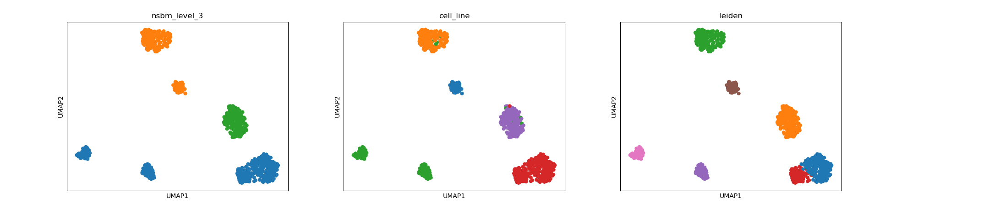

<IPython.core.display.Javascript object>


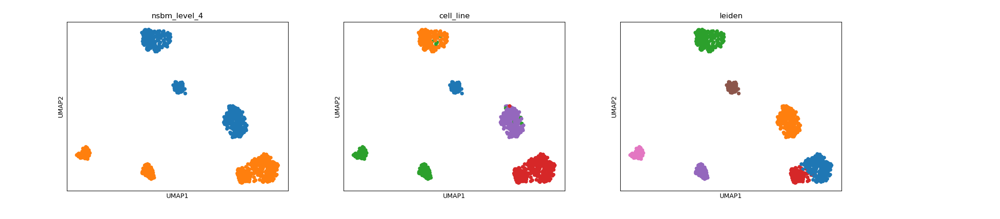

<IPython.core.display.Javascript object>


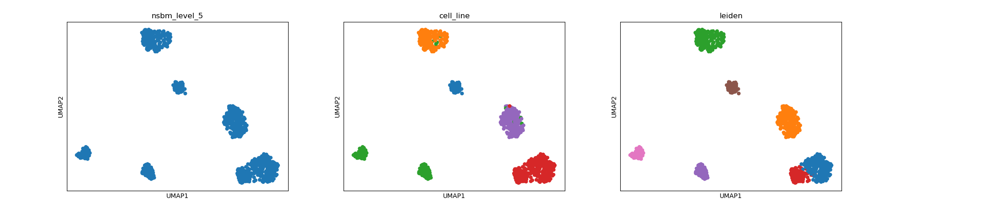

<IPython.core.display.Javascript object>


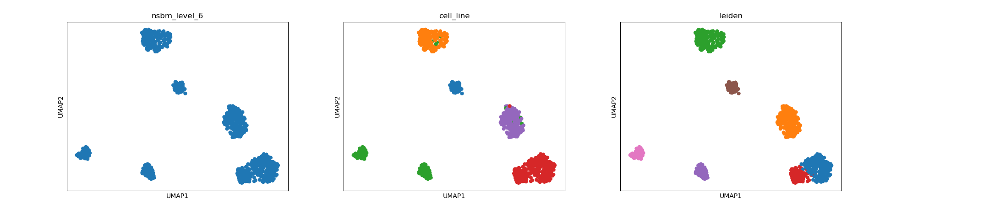

<IPython.core.display.Javascript object>


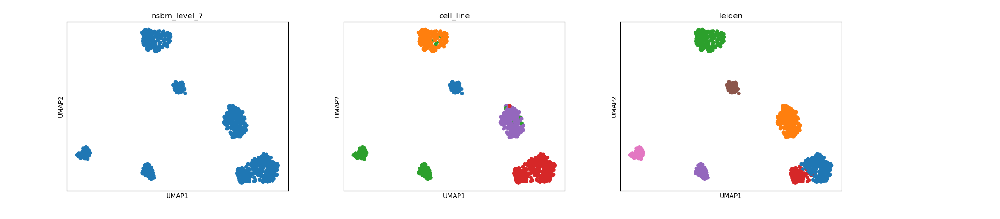

<IPython.core.display.Javascript object>


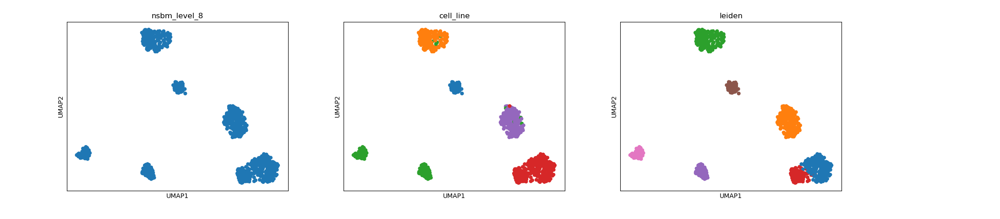

<IPython.core.display.Javascript object>


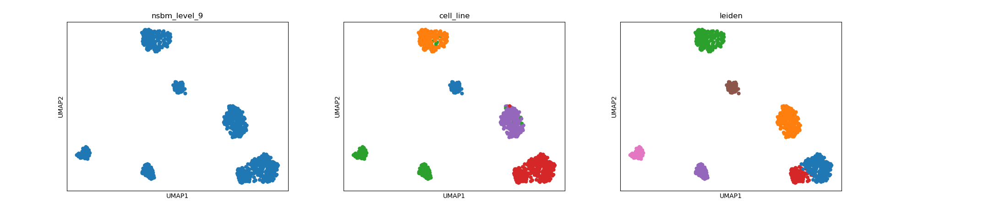

In [45]:
sc.tl.leiden(unw_adata30)
sc.tl.umap(unw_adata30)
sc.pl.umap(unw_adata30, color=["nsbm_level_1",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_2",  'cell_line' ,'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_3",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_4",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_5",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_6",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_7",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_8",   'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata30, color=["nsbm_level_9",   'cell_line','leiden'], legend_loc='on_data')

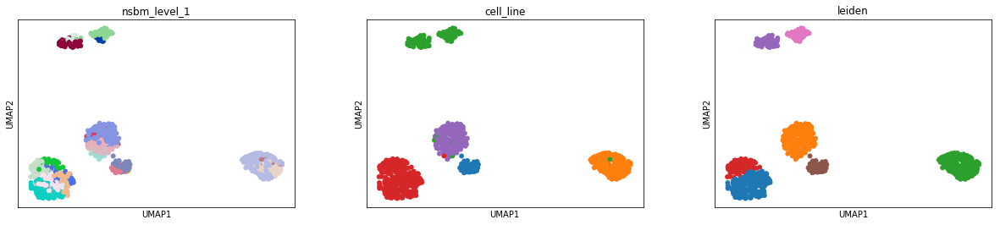

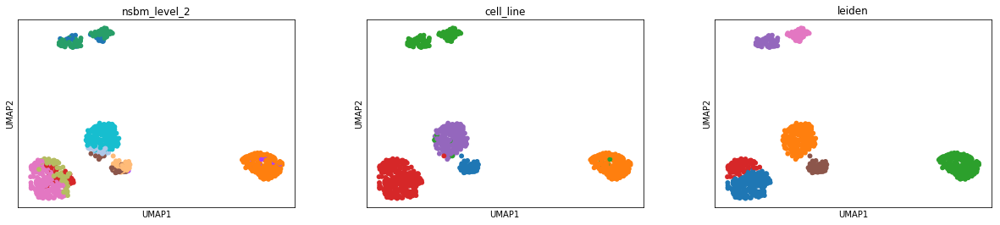

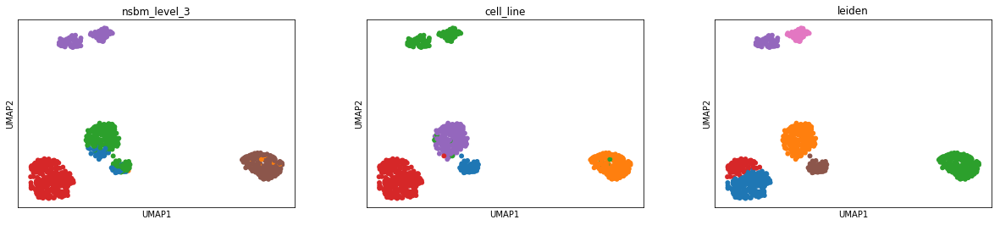

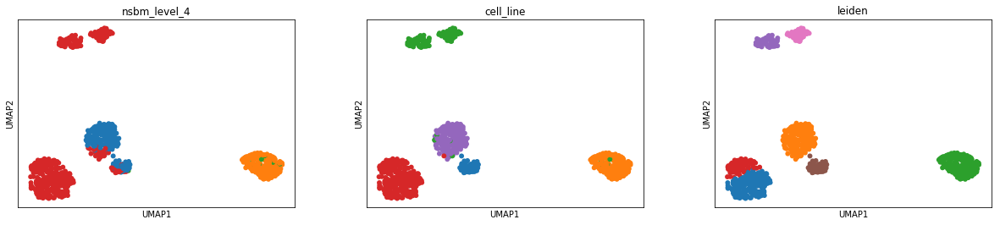

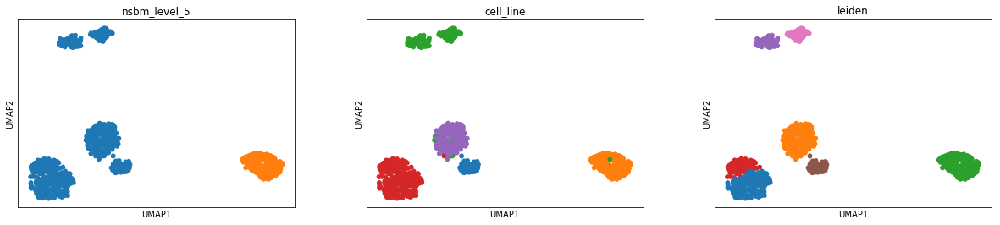

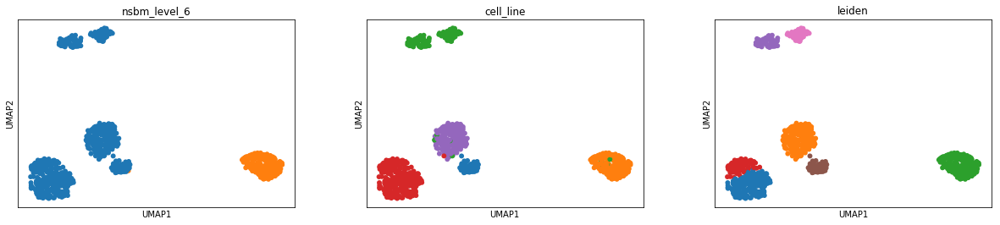

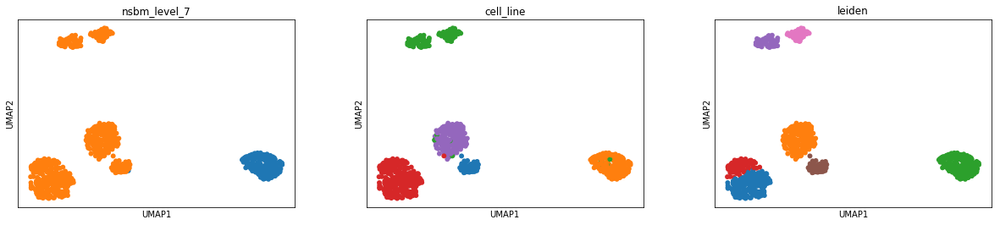

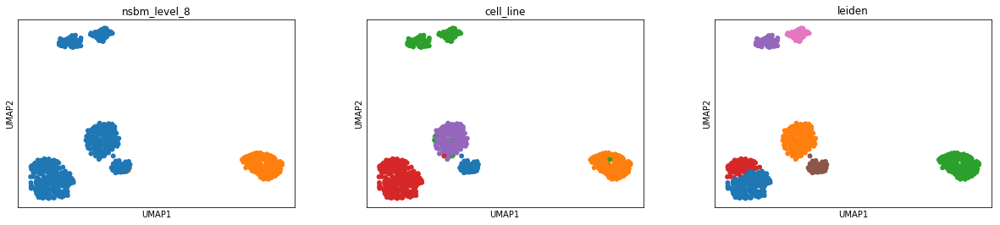

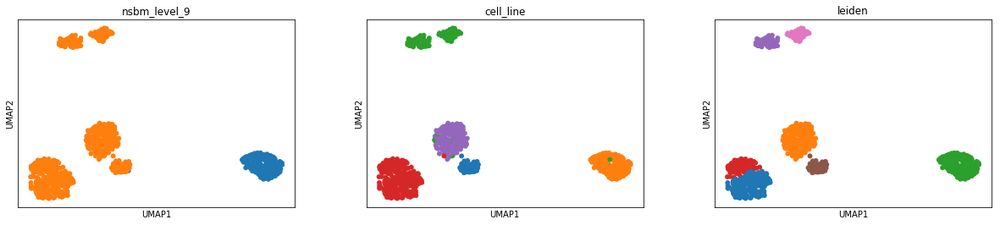

In [20]:
sc.tl.leiden(unw_adata100)
sc.tl.umap(unw_adata100)
sc.pl.umap(unw_adata100, color=["nsbm_level_1", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_2", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_3", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_4", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_5", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_6", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_7", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_8", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(unw_adata100, color=["nsbm_level_9", 'cell_line', 'leiden'], legend_loc='on_data')

### nsbm weighted

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


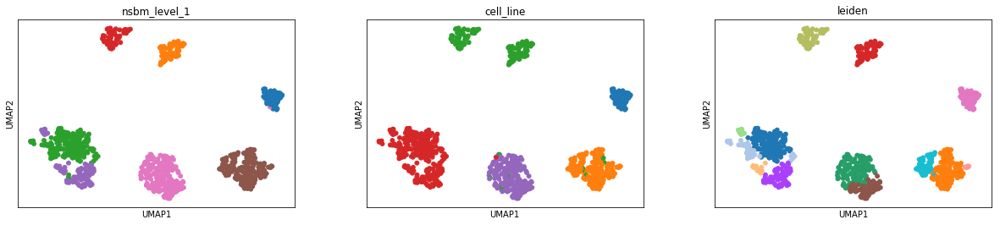

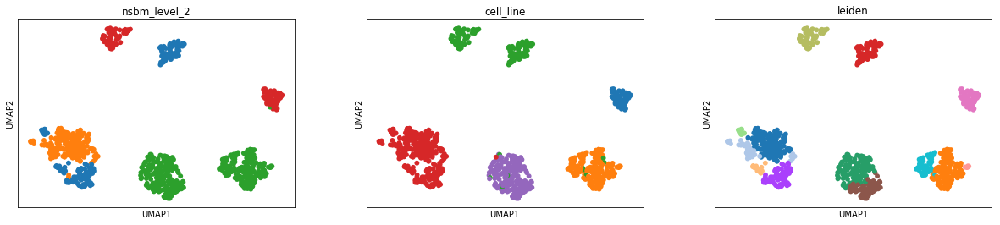

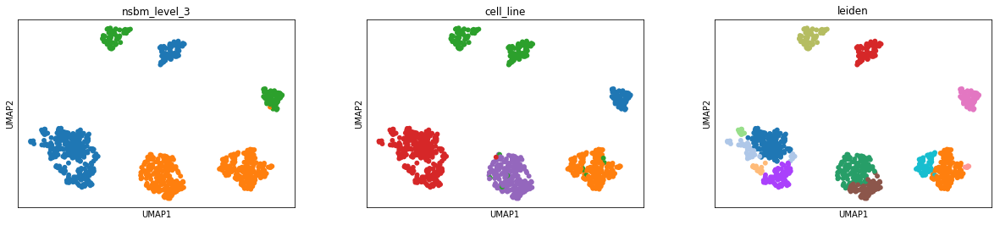

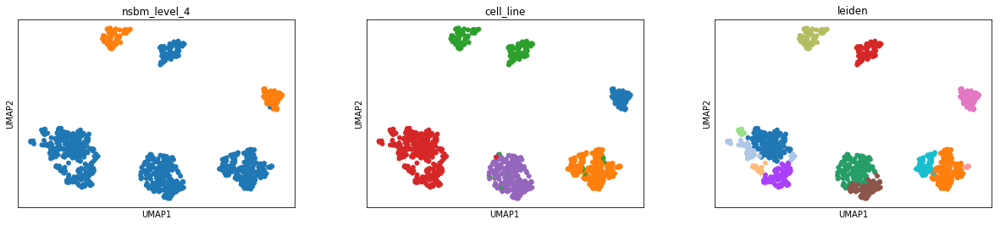

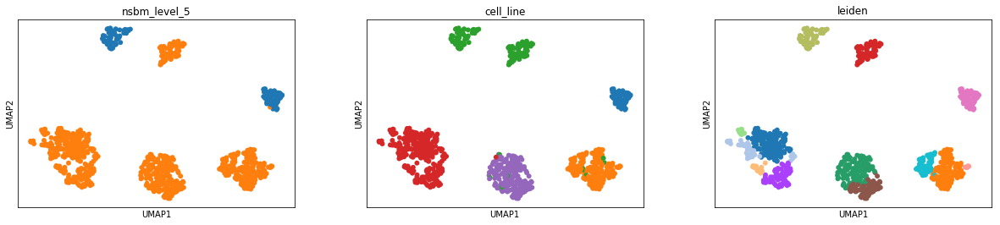

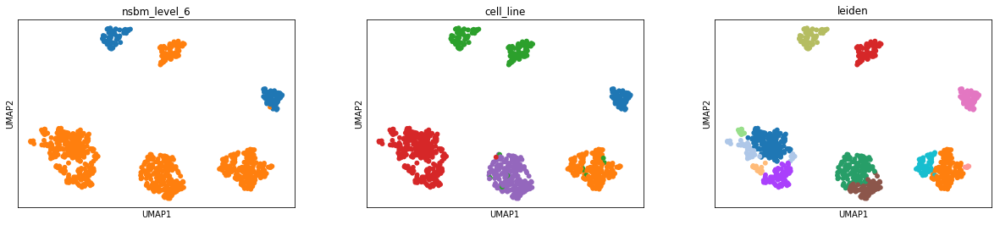

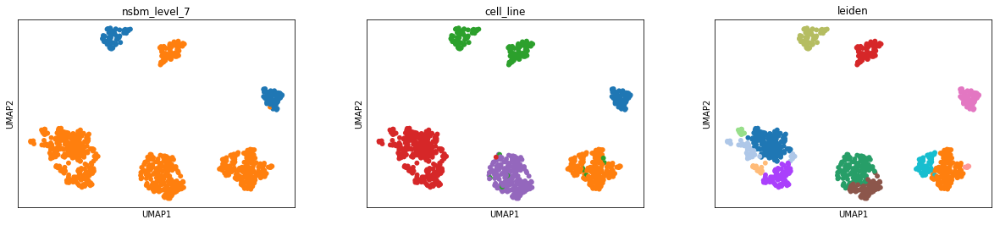

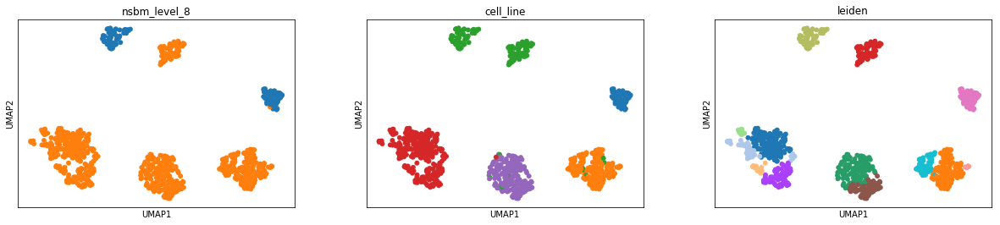

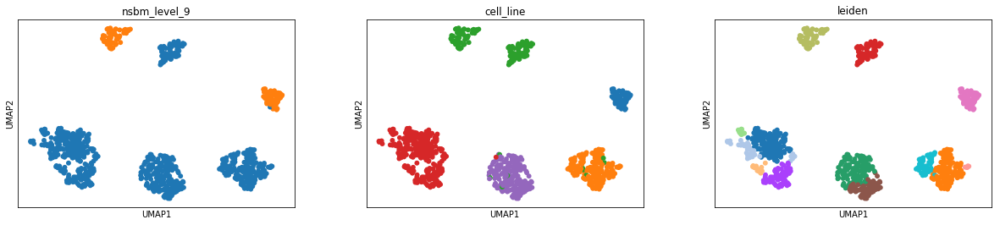

In [6]:
sc.tl.leiden(w_adata5)
sc.tl.umap(w_adata5)
sc.pl.umap(w_adata5, color=["nsbm_level_1", 'cell_line', 'leiden'],legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_2", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_3", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_4", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_5", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_6", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_7", 'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_8",  'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata5, color=["nsbm_level_9",  'cell_line','leiden'], legend_loc='on_data')

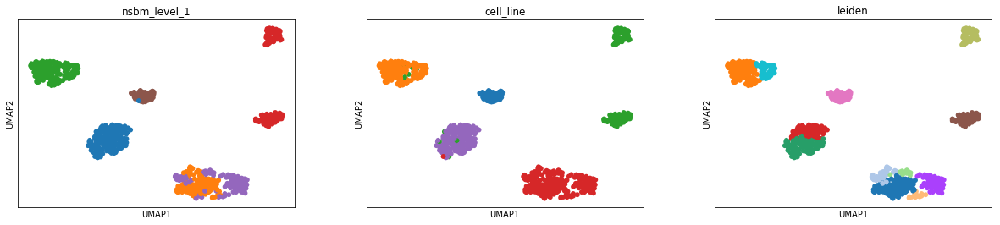

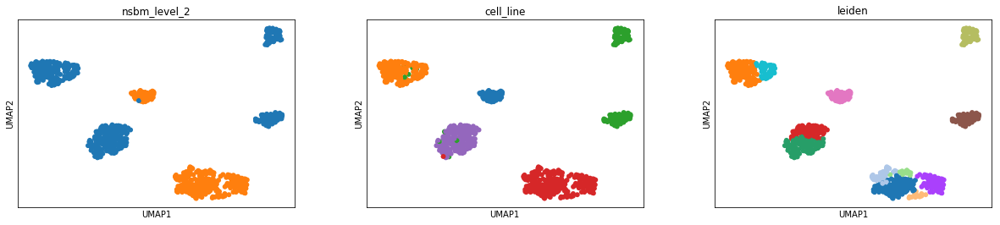

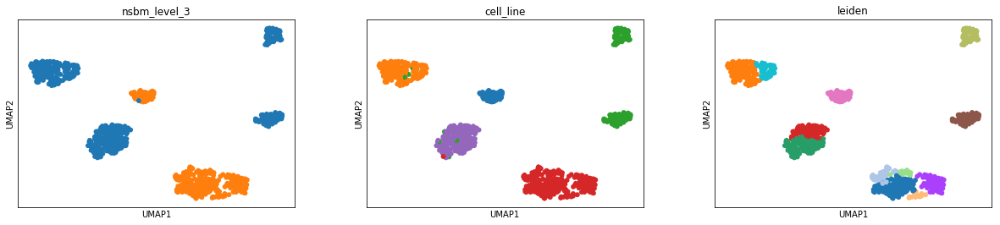

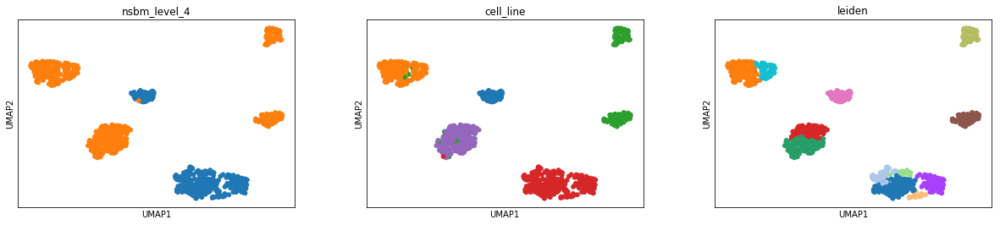

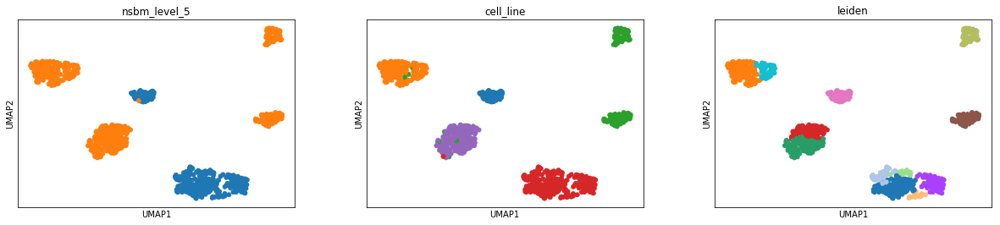

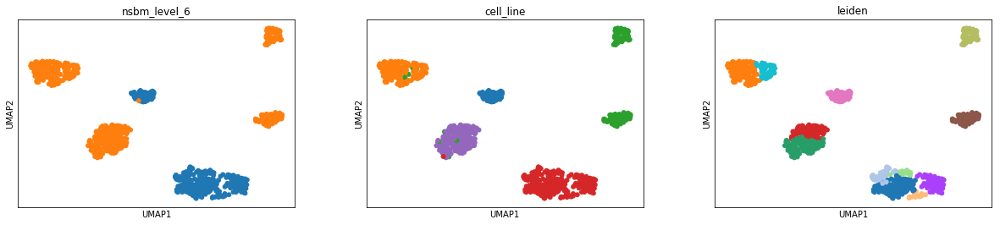

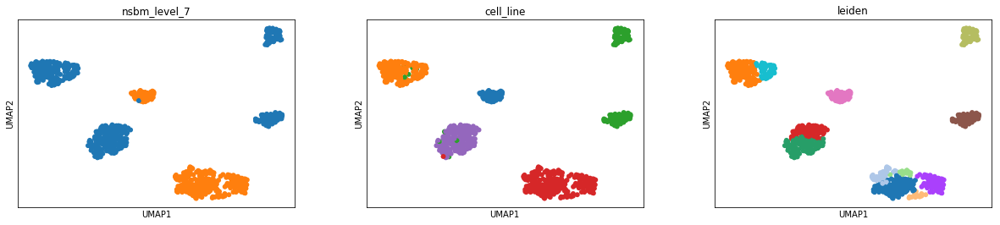

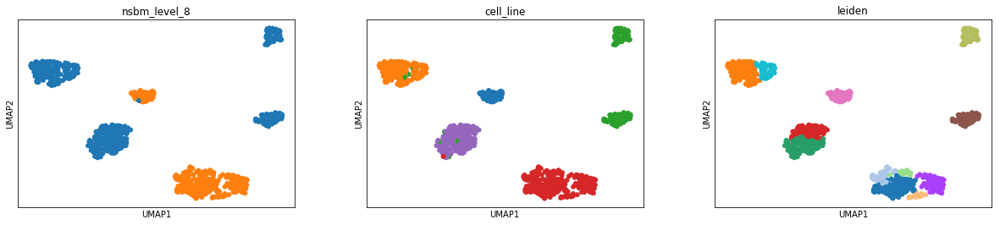

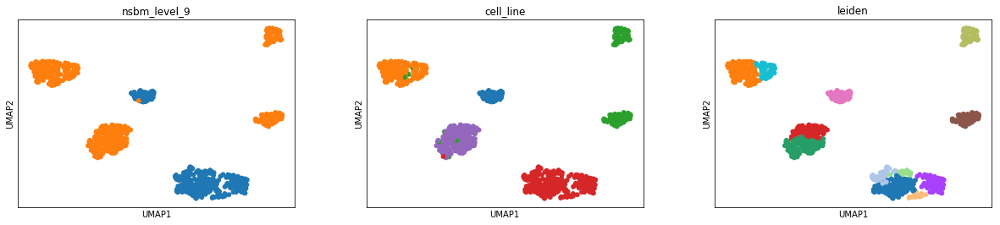

In [7]:
sc.tl.leiden(w_adata10)
sc.tl.umap(w_adata10)
sc.pl.umap(w_adata10, color=["nsbm_level_1", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_2",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_3",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_4",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_5",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_6",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_7", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_8", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata10, color=["nsbm_level_9", 'cell_line','leiden'], legend_loc='on_data')

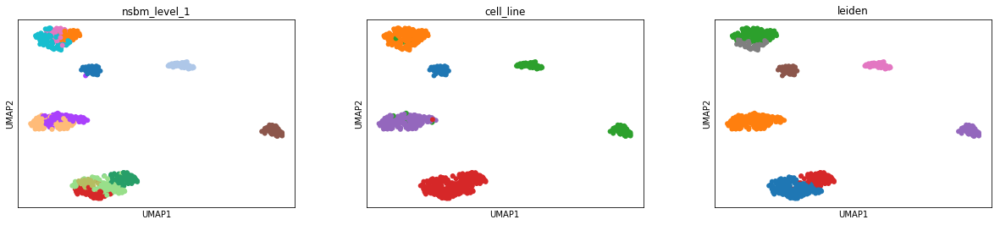

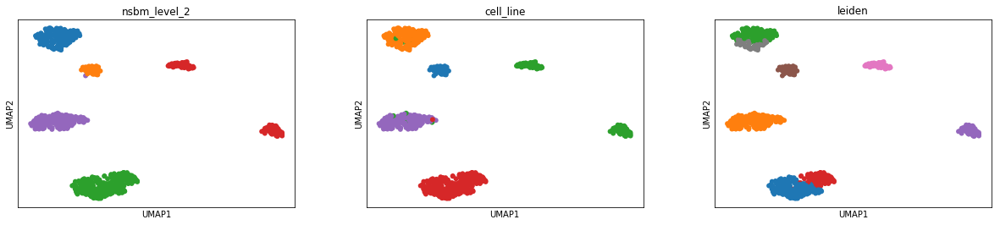

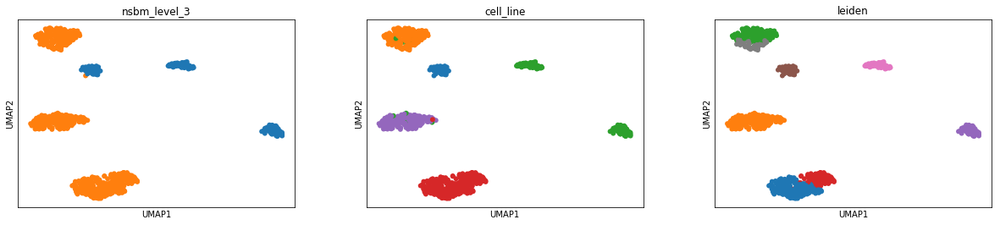

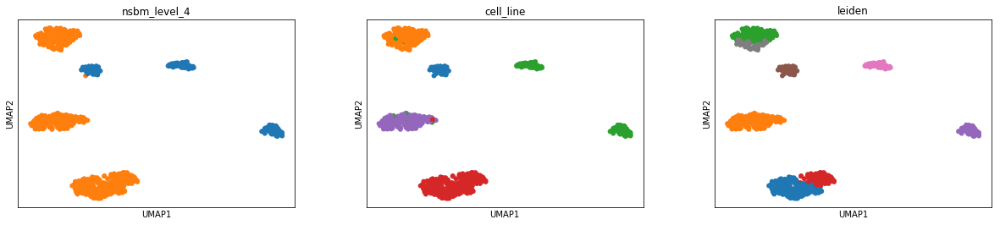

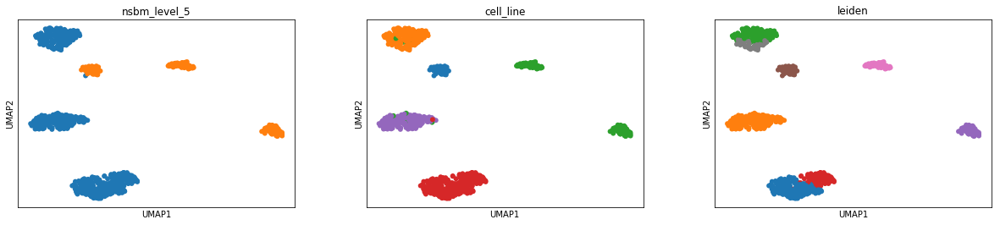

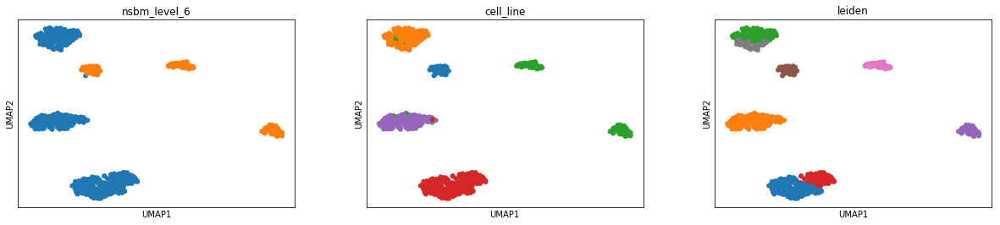

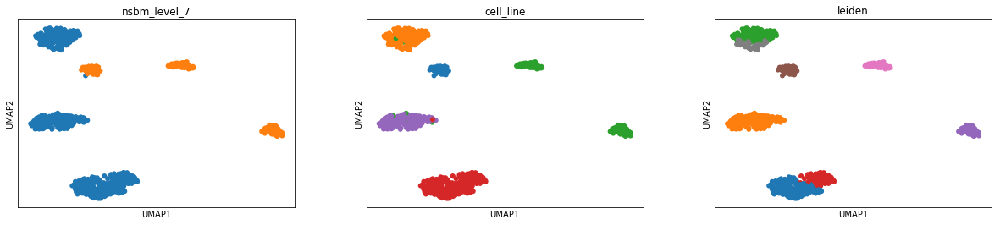

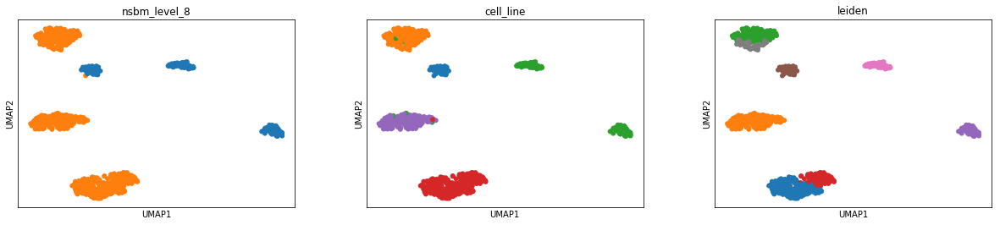

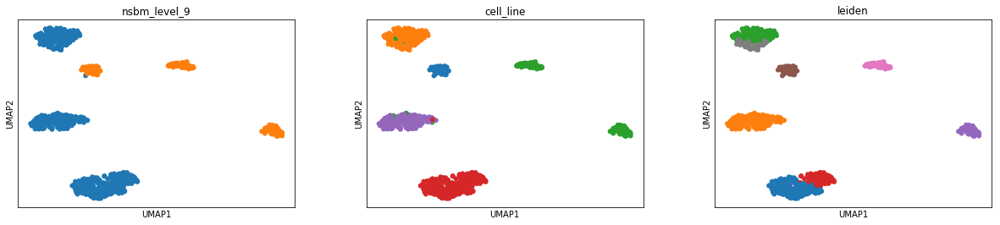

In [8]:
sc.tl.leiden(w_adata20)
sc.tl.umap(w_adata20)
sc.pl.umap(w_adata20, color=["nsbm_level_1",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_2",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_3",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_4", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_5", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_6", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_7",'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_8", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata20, color=["nsbm_level_9", 'cell_line','leiden'], legend_loc='on_data')

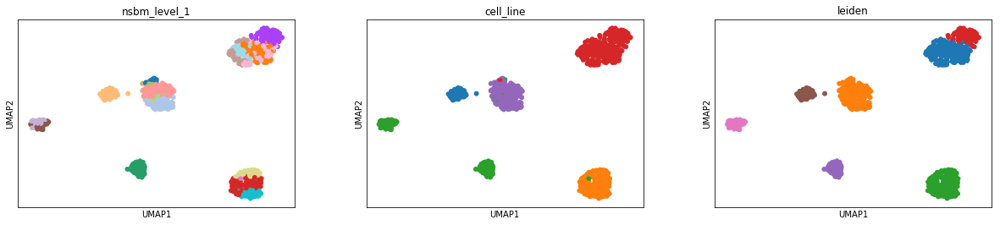

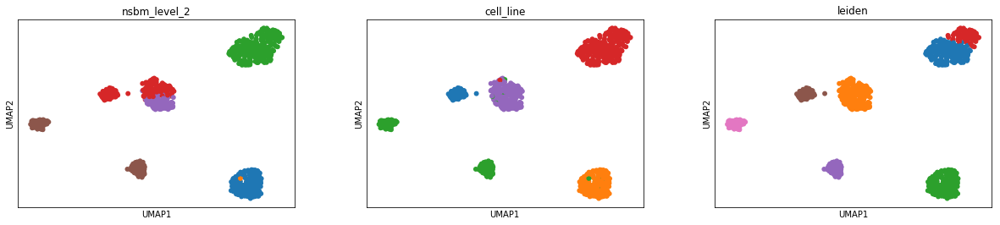

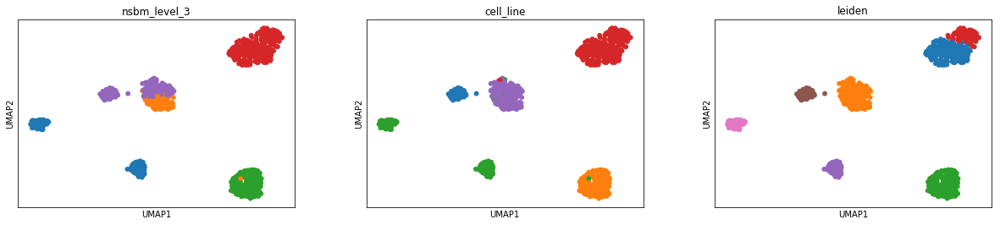

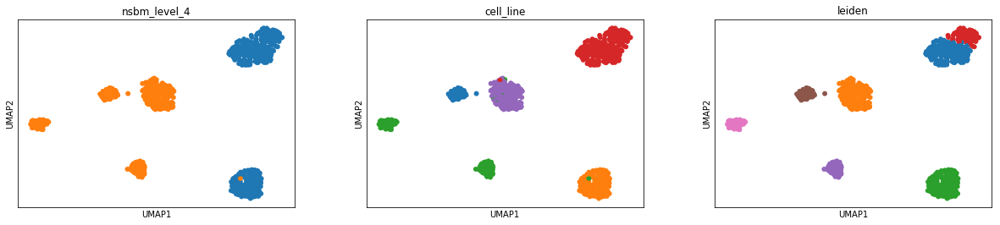

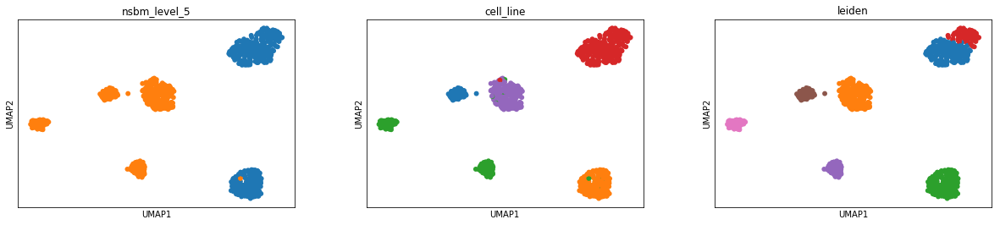

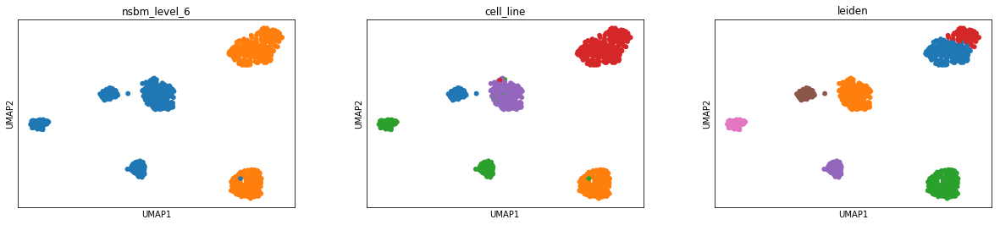

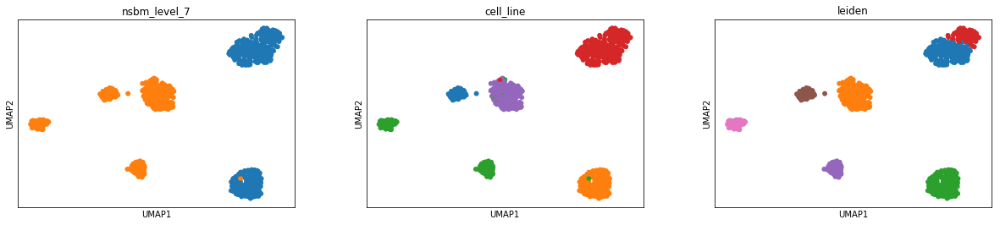

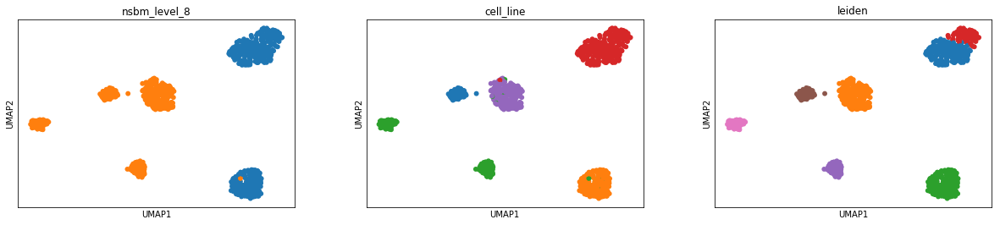

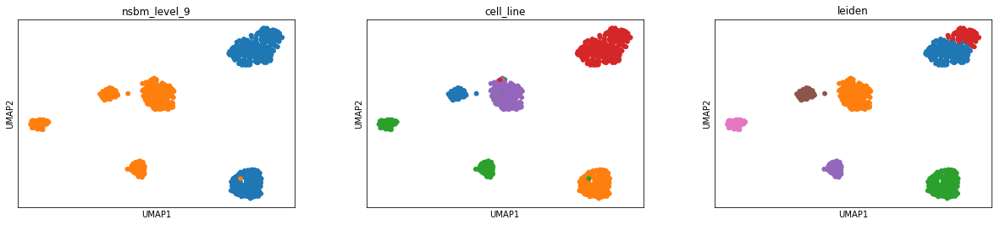

In [9]:
sc.tl.leiden(w_adata50)
sc.tl.umap(w_adata50)
sc.pl.umap(w_adata50, color=["nsbm_level_1",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_2",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_3",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_4", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_5", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_6", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_7", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_8", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata50, color=["nsbm_level_9", 'cell_line','leiden'], legend_loc='on_data')

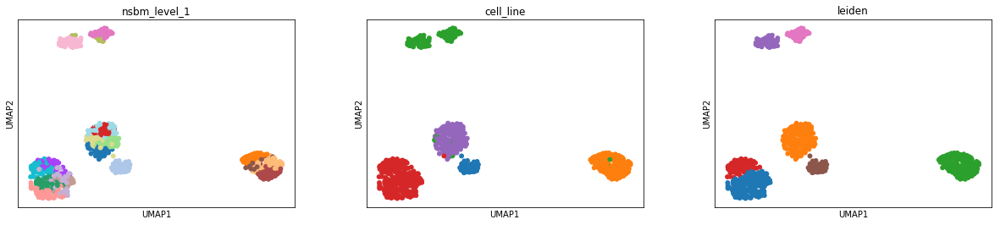

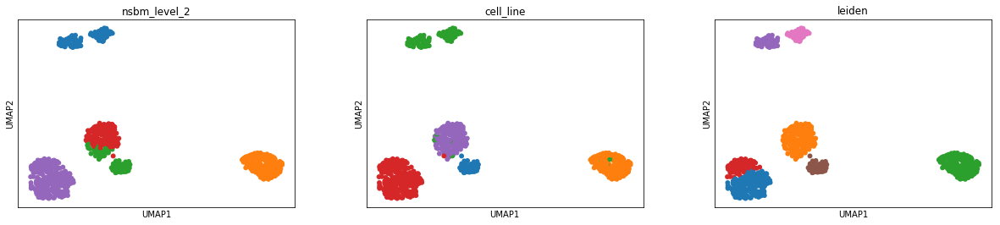

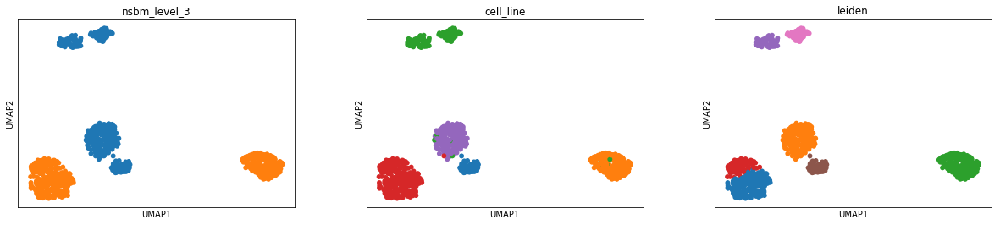

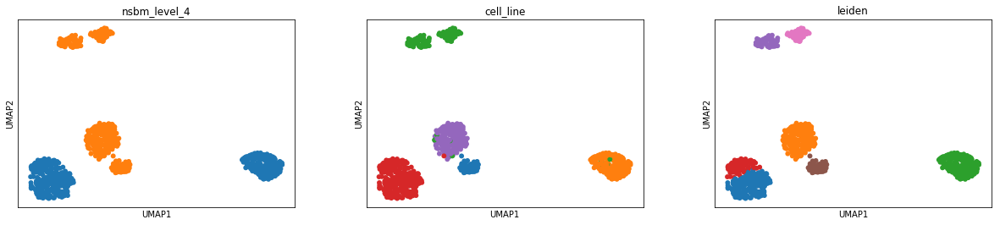

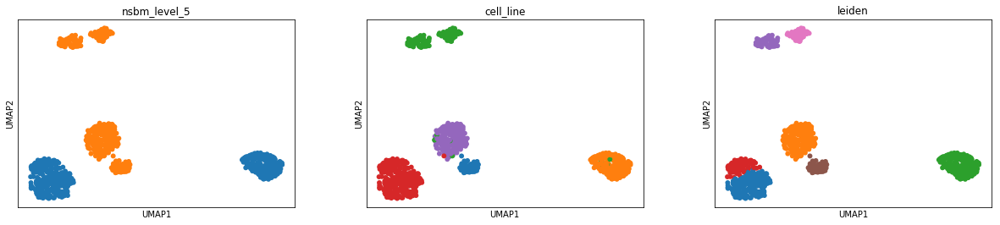

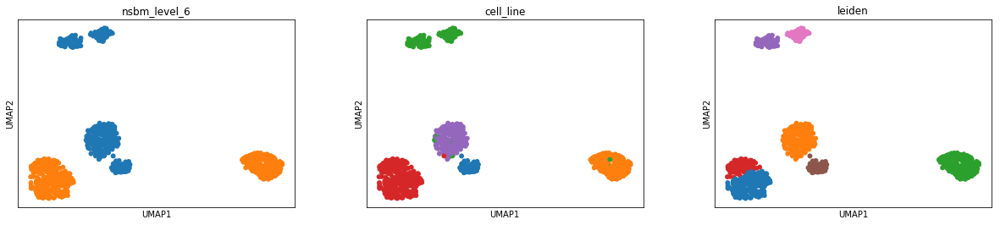

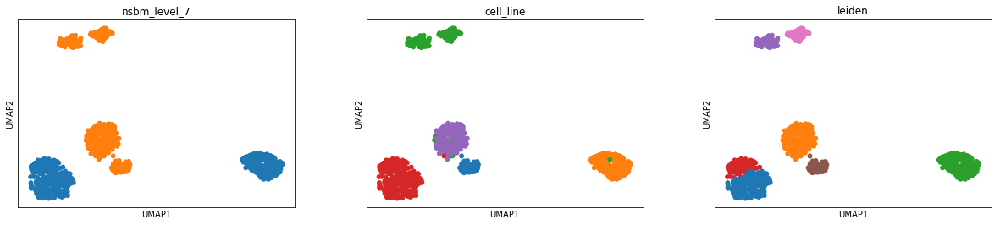

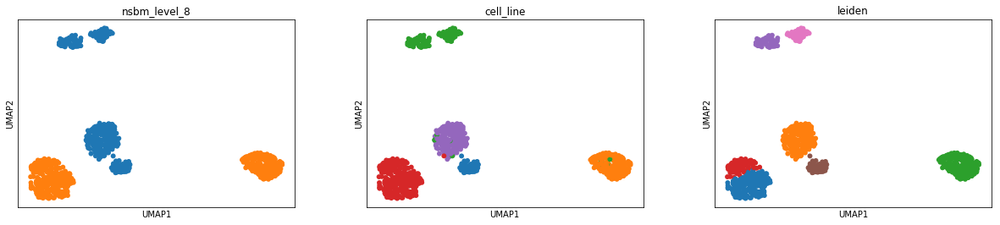

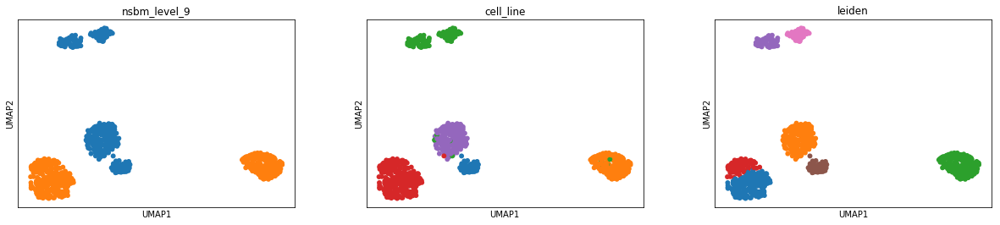

In [10]:
sc.tl.leiden(w_adata100)
sc.tl.umap(w_adata100)
sc.pl.umap(w_adata100, color=["nsbm_level_1",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_2",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_3",'cell_line', 'leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_4", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_5", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_6", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_7", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_8", 'cell_line','leiden'], legend_loc='on_data')
sc.pl.umap(w_adata100, color=["nsbm_level_9", 'cell_line','leiden'], legend_loc='on_data')

# 3) MI comparison
### 3.1) nsbm Unweighted vs leiden unweighted
##### adata 5

In [42]:
unw_adata5.obs

,n_genes,percent_mito,n_counts,S_score,G2M_score,phase,cell_line,nsbm_level_1,nsbm_level_2,nsbm_level_3,nsbm_level_4,nsbm_level_5,nsbm_level_6,nsbm_level_7,nsbm_level_8,nsbm_level_9
index,,,,,,,,,,,,,,,,
Lib90_00004,7089,0.043412,86727.0,0.079196,0.237331,G2M,HCC827,7,3,0,0,0,0,0,0,0
Lib90_00006,6858,0.045231,81803.0,-0.130885,-0.170015,G1,H1975,4,2,1,0,0,0,0,0,0
Lib90_00007,7172,0.044355,80554.0,0.093949,-0.103920,S,H1975,4,2,1,0,0,0,0,0,0
Lib90_00012,6534,0.042883,76394.0,0.053524,0.108217,G2M,HCC827,7,3,0,0,0,0,0,0,0
Lib90_00013,6658,0.046912,79958.0,-0.042504,0.573725,G2M,HCC827,7,3,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lib90_03981,1977,0.016784,5958.0,0.131211,-0.092011,S,H838,2,1,0,0,0,0,0,0,0
Lib90_04019,1826,0.012507,5357.0,-0.060814,-0.191000,G1,A549,1,1,0,0,0,0,0,0,0
Lib90_04024,1810,0.000497,6037.0,0.166979,0.090700,S,H2228,0,0,1,0,0,0,0,0,0


In [43]:
nsbm_levels = [x for x in unw_adata5.obs_keys() if x.startswith("nsbm")]

In [44]:
unw_leiden_clusters5.columns

Float64Index([               0.0,              0.005,               0.01,
                           0.015,               0.02,              0.025,
                            0.03,              0.035,               0.04,
                           0.045,
              ...
              0.9500000000000001, 0.9550000000000001,               0.96,
                           0.965,               0.97,              0.975,
                            0.98,              0.985,               0.99,
                           0.995],
             dtype='float64', length=200)

In [82]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters5.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [83]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata5.obs.loc[:, NL], 
                                           unw_leiden_clusters5.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [89]:
array[1]

array([0.84984586, 0.84984586, 1.        , 1.        , 1.        ,
       1.        , 1.        , 0.96345723, 0.96345723, 0.96345723,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.91092949,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.91092949,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.91092949,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.91092949,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.91092949,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.91092949,
       0.91092949, 0.91092949, 0.91092949, 0.91092949, 0.85659259,
       0.85659259, 0.85659259, 0.85659259, 0.91092949, 0.8540449 ,
       0.8540449 , 0.8540449 , 0.8511965 , 0.8511965 , 0.8511965 ,
       0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 ,
       0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 ,
       0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 ,
       0.8511965 , 0.8511965 , 0.8511965 , 0.8511965 , 0.85119

In [85]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [87]:
for i in SBM_gruppi:
    leiden_vs_SBM.loc[:,i]=array[i]

In [88]:
leiden_vs_SBM

,0,1,2,3,4,5,6,7,8
0.000,0.669352,0.849846,0.821742,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15
0.005,0.669352,0.849846,0.821742,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15
0.010,0.810205,1,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
0.015,0.810205,1,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
0.020,0.810205,1,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
...,...,...,...,...,...,...,...,...,...
0.975,0.841014,0.725109,0.456206,-9.53153e-17,-9.53153e-17,-9.53153e-17,-9.53153e-17,-9.53153e-17,-9.53153e-17
0.980,0.824788,0.709062,0.444075,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17
0.985,0.824788,0.709062,0.444075,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17
0.990,0.824788,0.709062,0.444075,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17


In [90]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_5_unwleiden_unwnsbm.pkl','wb'),2)

##### adata 10

In [66]:
nsbm_levels = [x for x in unw_adata10.obs_keys() if x.startswith("nsbm")]

In [91]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters10.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [92]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata10.obs.loc[:, NL], 
                                           unw_leiden_clusters10.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [93]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [94]:
for i in range(len(array)):
    leiden_vs_SBM.loc[:,i]=array[i]

In [95]:
leiden_vs_SBM

,0,1,2,3,4,5,6,7,8
0.000,-5.91331e-18,1.03286e-15,-4.25915e-16,0,1,1,1,1,1
0.005,0.549235,0.795164,0.680058,0.821742,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15
0.010,0.676497,0.942305,0.737746,0.681445,2.89187e-16,2.89187e-16,2.89187e-16,2.89187e-16,2.89187e-16
0.015,0.676497,0.942305,0.737746,0.681445,2.89187e-16,2.89187e-16,2.89187e-16,2.89187e-16,2.89187e-16
0.020,0.676497,0.942305,0.737746,0.681445,2.89187e-16,2.89187e-16,2.89187e-16,2.89187e-16,2.89187e-16
...,...,...,...,...,...,...,...,...,...
0.975,0.809042,0.906412,0.729765,0.55254,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16
0.980,0.809042,0.906412,0.729765,0.55254,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16
0.985,0.809042,0.906412,0.729765,0.55254,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16
0.990,0.809042,0.906412,0.729765,0.55254,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16,3.47411e-16


In [96]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_10_unwleiden_unwnsbm.pkl','wb'),2)

##### adata 20

In [129]:
nsbm_levels = [x for x in unw_adata20.obs_keys() if x.startswith("nsbm")]

In [130]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters20.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [131]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata20.obs.loc[:, NL], 
                                           unw_leiden_clusters20.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [132]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [133]:
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 

In [134]:
leiden_vs_SBM

,0,1,2,3,4,5,6,7,8
0.000,-1.75467e-16,1.02751e-15,-4.25915e-16,0,1,1,1,1,1
0.005,0.504916,0.75187,0.658785,0.375282,2.79552e-15,2.79552e-15,2.79552e-15,2.79552e-15,2.79552e-15
0.010,0.504916,0.75187,0.658785,0.375282,2.79552e-15,2.79552e-15,2.79552e-15,2.79552e-15,2.79552e-15
0.015,0.64216,0.914818,0.873809,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
0.020,0.64216,0.914818,0.873809,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
...,...,...,...,...,...,...,...,...,...
0.975,0.763477,0.883701,0.731182,0.553761,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16
0.980,0.763477,0.883701,0.731182,0.553761,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16
0.985,0.763477,0.883701,0.731182,0.553761,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16
0.990,0.763477,0.883701,0.731182,0.553761,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16,-1.83179e-16


In [135]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_20_unwleiden_unwnsbm.pkl','wb'),2)

##### adata 30 

In [136]:
nsbm_levels = [x for x in unw_adata30.obs_keys() if x.startswith("nsbm")]

In [137]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters30.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [138]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata30.obs.loc[:, NL], 
                                           unw_leiden_clusters30.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [139]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [140]:
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 

In [141]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_30_unwleiden_unwnsbm.pkl','wb'),2)

##### adata 40

In [142]:
nsbm_levels = [x for x in unw_adata40.obs_keys() if x.startswith("nsbm")]

In [143]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters40.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [144]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata40.obs.loc[:, NL], 
                                           unw_leiden_clusters40.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [145]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [146]:
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 

In [147]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_40_unwleiden_unwnsbm.pkl','wb'),2)

##### adata 50

In [148]:
nsbm_levels = [x for x in unw_adata50.obs_keys() if x.startswith("nsbm")]

In [149]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters50.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [150]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata50.obs.loc[:, NL], 
                                           unw_leiden_clusters50.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [151]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [152]:
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 

In [153]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_50_unwleiden_unwnsbm.pkl','wb'),2)

##### adata 100

In [154]:
nsbm_levels = [x for x in unw_adata100.obs_keys() if x.startswith("nsbm")]

In [155]:
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = unw_leiden_clusters100.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

In [156]:
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata100.obs.loc[:, NL], 
                                           unw_leiden_clusters100.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]

In [157]:
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))

In [158]:
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 

In [159]:
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_100_unwleiden_unwnsbm.pkl','wb'),2)

### 3.2) nsbm weighted vs leiden weighted
##### adata5

In [105]:
nsbm_levels = [x for x in w_adata5.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters5.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata5.obs.loc[:, NL], 
                                           w_leiden_clusters5.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_5_wleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata10

In [106]:
nsbm_levels = [x for x in w_adata10.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters10.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata10.obs.loc[:, NL], 
                                           w_leiden_clusters10.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_10_wleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata20

In [107]:
nsbm_levels = [x for x in w_adata20.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters20.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata20.obs.loc[:, NL], 
                                           w_leiden_clusters20.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_20_wleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata 30

In [ ]:
nsbm_levels = [x for x in w_adata30.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters30.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata30.obs.loc[:, NL], 
                                           w_leiden_clusters30.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_30_wleiden_wnsbm.csv','wb'),2)

##### adata 40

In [ ]:
nsbm_levels = [x for x in w_adata40.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters40.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata40.obs.loc[:, NL], 
                                           w_leiden_clusters40.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_40_wleiden_wnsbm.csv','wb'),2)

##### adata50

In [108]:
nsbm_levels = [x for x in w_adata50.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters50.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata50.obs.loc[:, NL], 
                                           w_leiden_clusters50.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_50_wleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata100

In [109]:
nsbm_levels = [x for x in w_adata100.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = w_leiden_clusters100.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata100.obs.loc[:, NL], 
                                           w_leiden_clusters100.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_100_wleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

### 3.3) nsbm weighted vs leiden unweighted
##### adata5

In [110]:
nsbm_levels = [x for x in w_adata5.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters5.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata5.obs.loc[:, NL], 
                                           unw_leiden_clusters5.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_5_unwleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata10

In [111]:
nsbm_levels = [x for x in w_adata10.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters10.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata10.obs.loc[:, NL], 
                                           unw_leiden_clusters10.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_10_unwleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata20

In [112]:
nsbm_levels = [x for x in w_adata20.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters20.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata20.obs.loc[:, NL], 
                                           unw_leiden_clusters20.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_20_unwleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata30

In [ ]:
nsbm_levels = [x for x in w_adata30.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters30.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata30.obs.loc[:, NL], 
                                           unw_leiden_clusters30.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_30_unwleiden_wnsbm.csv','wb'),2)

##### adata40

In [ ]:
nsbm_levels = [x for x in w_adata40.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters40.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata40.obs.loc[:, NL], 
                                           unw_leiden_clusters40.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_40_unwleiden_wnsbm.csv','wb'),2)

##### adata50

In [113]:
nsbm_levels = [x for x in w_adata50.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters50.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata50.obs.loc[:, NL], 
                                           unw_leiden_clusters50.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_50_unwleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

##### adata100

In [114]:
nsbm_levels = [x for x in w_adata100.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[1,2,3,4,5,6,7,8,9]
resolutions = unw_leiden_clusters100.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(w_adata100.obs.loc[:, NL], 
                                           unw_leiden_clusters100.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    for i in range(len(array)):
        leiden_vs_SBM.loc[:,x]=array[i] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_100_unwleiden_wnsbm.csv','wb'),2)

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
/home/morelli/anaconda3/envs/scrna_test/lib/python3.7/site-packages/sklearn/metrics/cluster/supervised.py:746: FutureWarning: The beh

### 3.4) nsbm unweighted vs leiden weighted
##### adata5

In [160]:
nsbm_levels = [x for x in unw_adata5.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters5.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata5.obs.loc[:, NL], 
                                           w_leiden_clusters5.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_5_wleiden_unwnsbm.pkl','wb'),2)

##### adata10

In [161]:
nsbm_levels = [x for x in unw_adata10.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters10.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata10.obs.loc[:, NL], 
                                           w_leiden_clusters10.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_10_wleiden_unwnsbm.pkl','wb'),2)

##### adata20

In [162]:
nsbm_levels = [x for x in unw_adata20.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters20.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata20.obs.loc[:, NL], 
                                           w_leiden_clusters20.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_20_wleiden_unwnsbm.pkl','wb'),2)

##### adata30

In [163]:
nsbm_levels = [x for x in unw_adata30.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters30.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata30.obs.loc[:, NL], 
                                           w_leiden_clusters30.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_30_wleiden_unwnsbm.pkl','wb'),2)

##### adate40

In [164]:
nsbm_levels = [x for x in unw_adata40.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters40.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata40.obs.loc[:, NL], 
                                           w_leiden_clusters40.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_40_wleiden_unwnsbm.pkl','wb'),2)

##### adata50

In [165]:
nsbm_levels = [x for x in unw_adata50.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters50.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)
foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata50.obs.loc[:, NL], 
                                           w_leiden_clusters50.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_50_wleiden_unwnsbm.pkl','wb'),2)

##### adata100

In [166]:
nsbm_levels = [x for x in unw_adata100.obs_keys() if x.startswith("nsbm")]
SBM_gruppi=[0,1,2,3,4,5,6,7,8]
resolutions = w_leiden_clusters100.columns
leiden_vs_SBM=pd.DataFrame(index=resolutions, columns=SBM_gruppi)

foobar= [sklearn.metrics.adjusted_mutual_info_score(unw_adata100.obs.loc[:, NL], 
                                           w_leiden_clusters100.loc[:, LR])
                                            for NL in nsbm_levels for LR in resolutions]
array=np.array(foobar).reshape((len(nsbm_levels), len(resolutions)))
for x in SBM_gruppi:
    leiden_vs_SBM.loc[:,x]=array[x] 
pickle.dump(leiden_vs_SBM, open('mi_10x/mi_100_wleiden_unwnsbm.pkl','wb'),2)

In [167]:
mi=pickle.load(open('mi_10x/mi_5_unwleiden_unwnsbm.pkl','rb'))

In [168]:
mi

,0,1,2,3,4,5,6,7,8
0.000,0.669352,0.849846,0.821742,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15
0.005,0.669352,0.849846,0.821742,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15,1.56249e-15
0.010,0.810205,1,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
0.015,0.810205,1,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
0.020,0.810205,1,0.680243,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16,8.24866e-16
...,...,...,...,...,...,...,...,...,...
0.975,0.841014,0.725109,0.456206,-9.53153e-17,-9.53153e-17,-9.53153e-17,-9.53153e-17,-9.53153e-17,-9.53153e-17
0.980,0.824788,0.709062,0.444075,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17
0.985,0.824788,0.709062,0.444075,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17
0.990,0.824788,0.709062,0.444075,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17,-8.06074e-17
